In [1]:
import pandas as pd
import numpy as np
import math
import statistics
import scipy as sp
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
import researchpy as rp

f table https://www.slideshare.net/gforce003/ftable

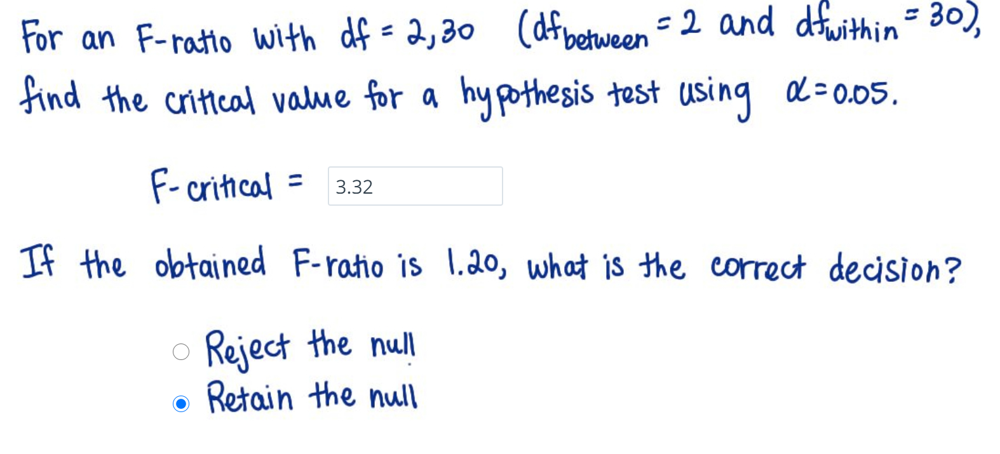

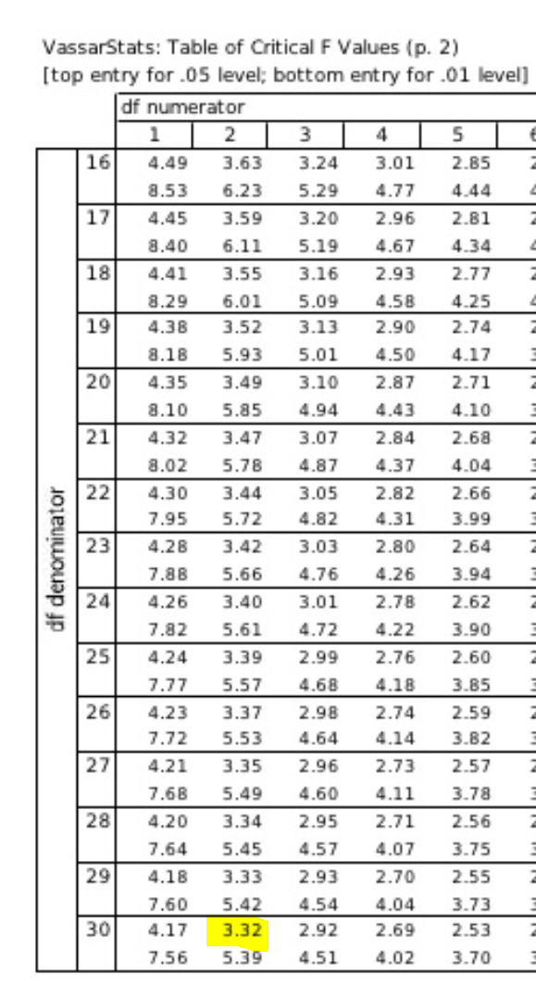

* f_critical(3.32)> f_stats(1.20) = failed to reject Ho.

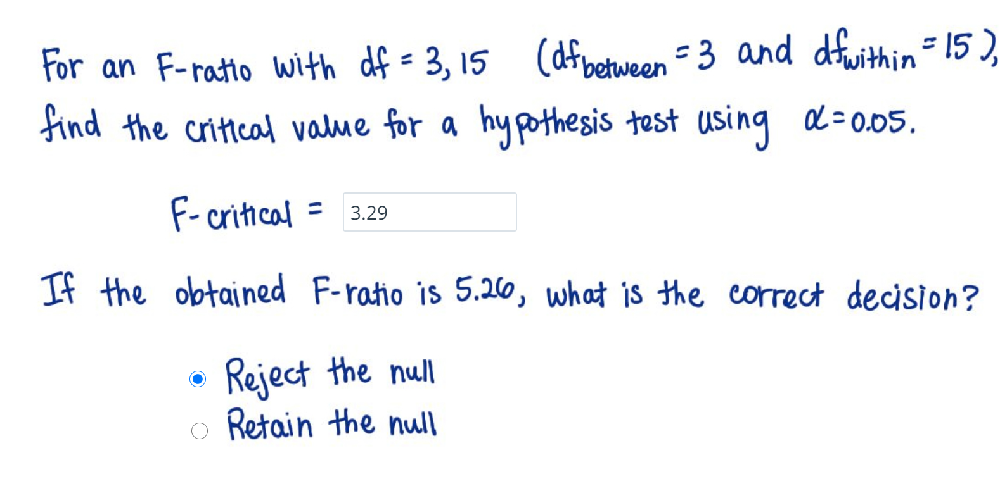

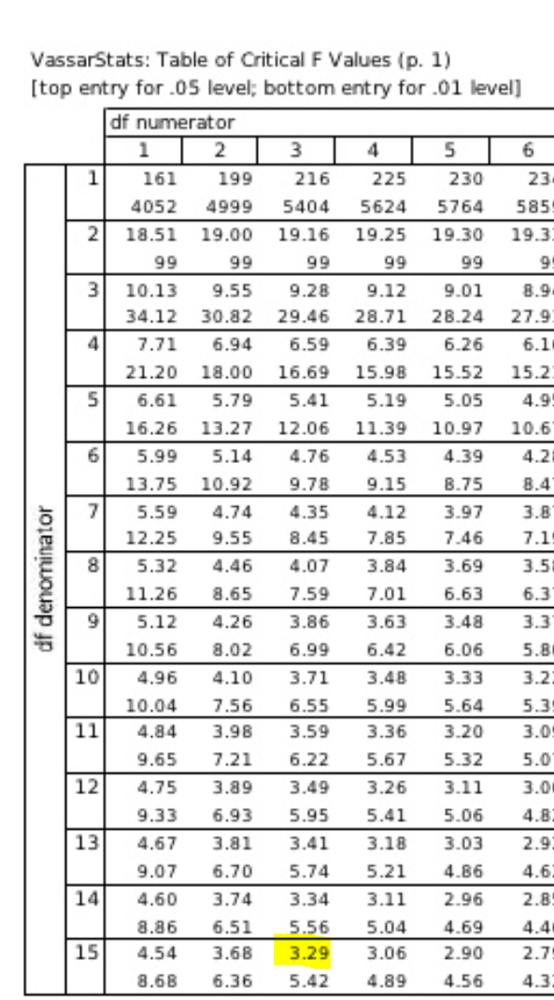

* f_critical(3.29) < f_stats(5,26) = reject Ho

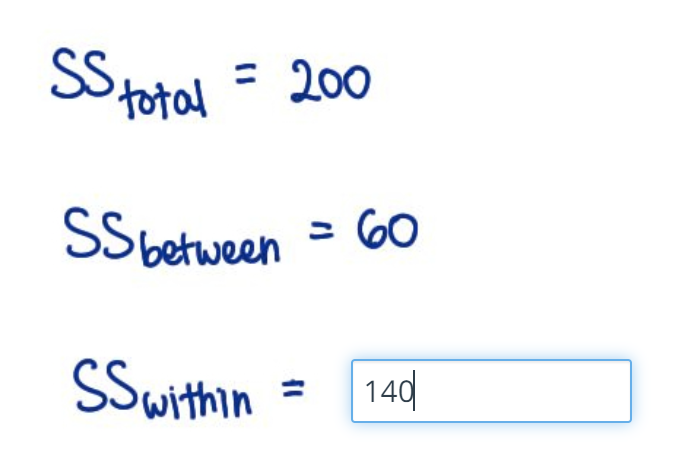

In [2]:
ssttl=200
ssbetween=60

In [3]:
sswithin = ssttl-ssbetween
sswithin 

140

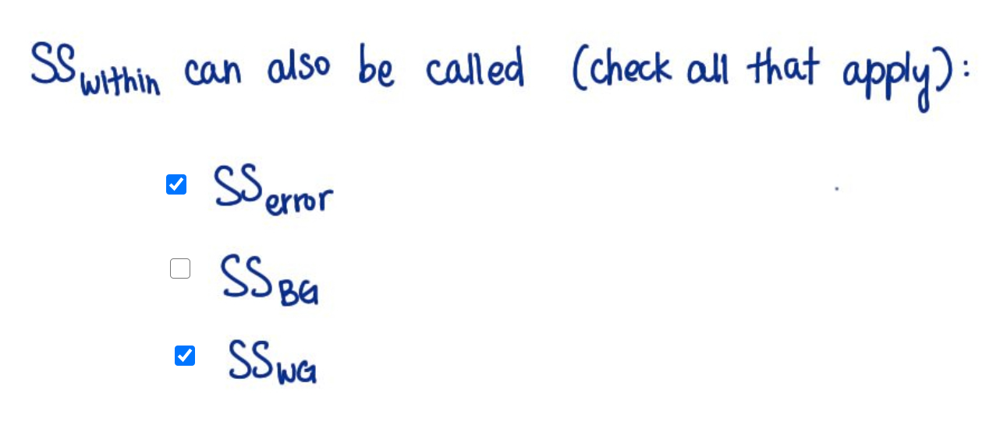

* SSbetween = **ss explained**
* SSwithin = **ss redicual, ss wg(within group)**

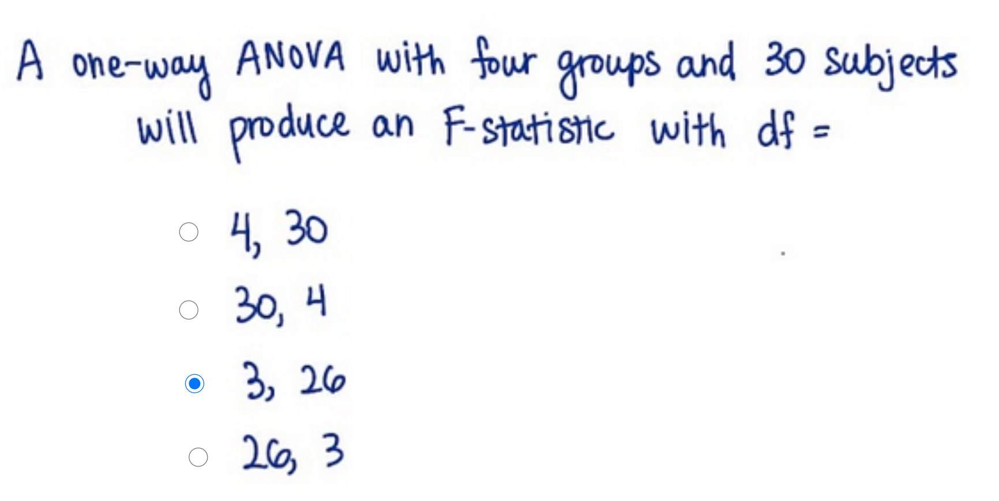

* dfbetween = k-1 :K is the number of population group
* dfwithin = N-k  :N is total sample size
* F(3,(dfbetween),26(dfwithin)) 

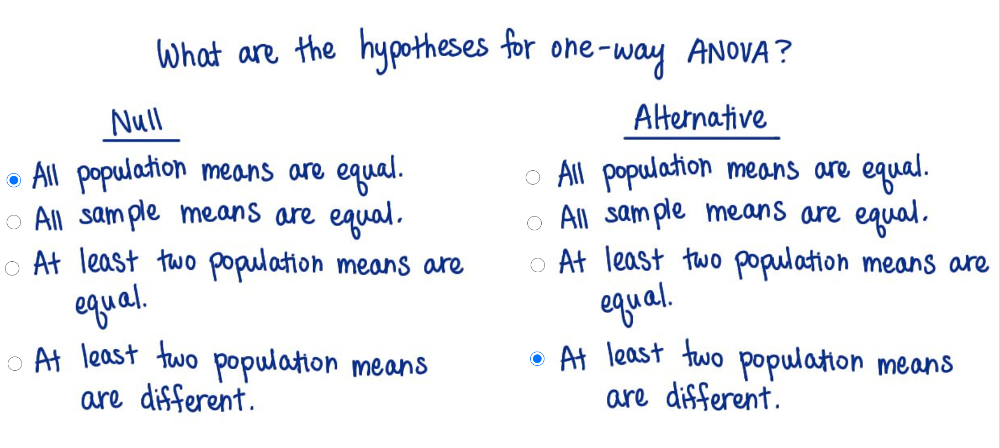

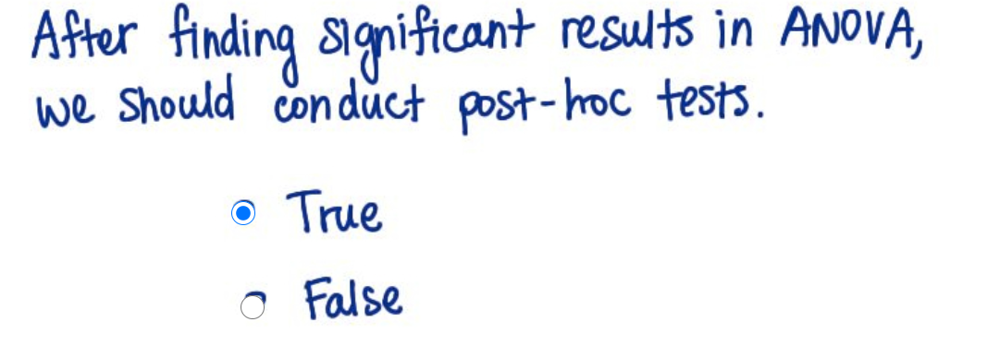

* conduct post-hoc tests in order to determine which pair(s) of groups were significantly different, since ANOVA only tells us that at least one pair is significantly different.

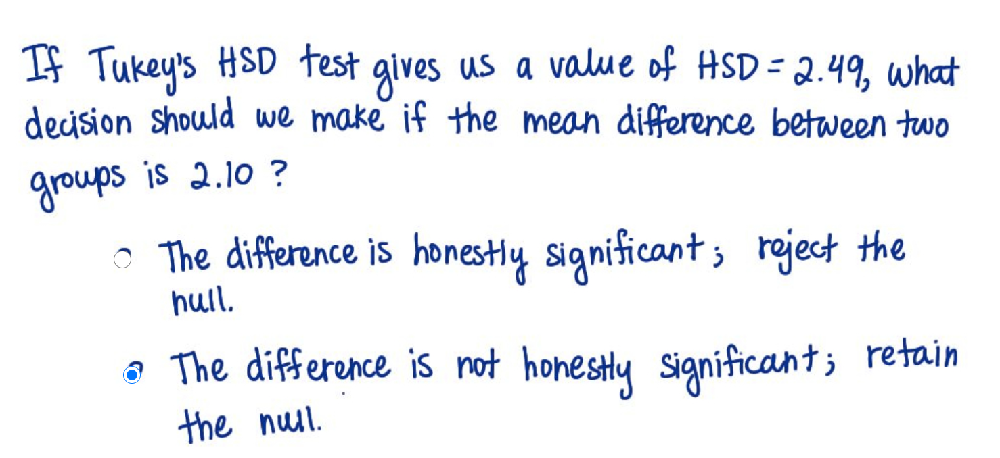

* The HSD gives the minimum difference required to be honestly significant.
* HSC > mean difference = not honestly significantly different. 
* HSC < mean difference = **honestly significantly different**

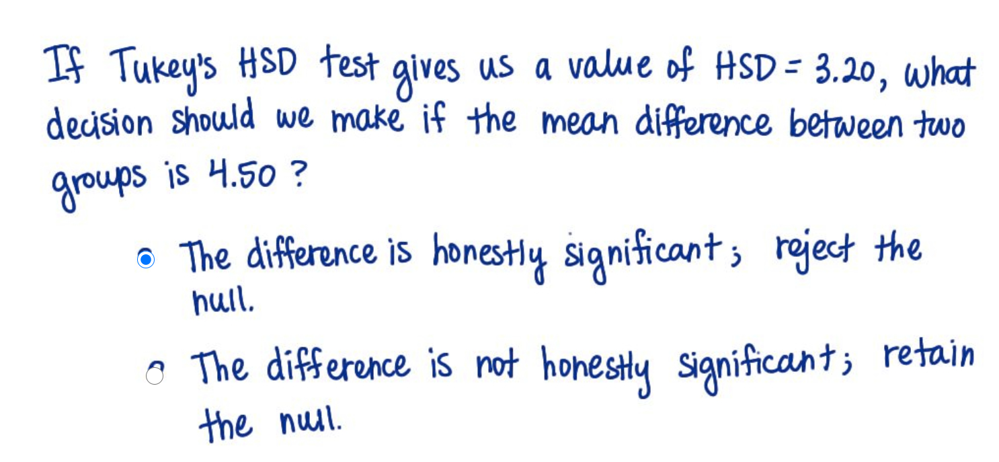

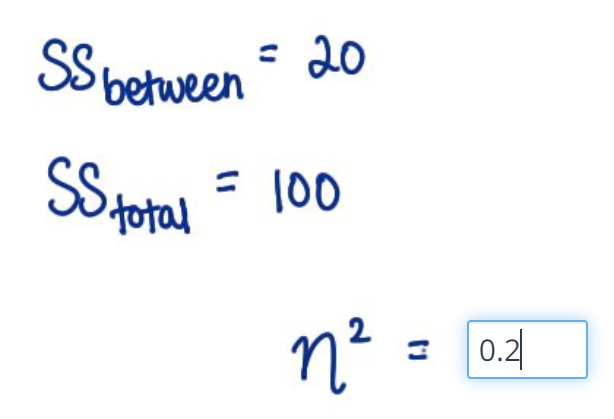

In [8]:
ssbetween =20
ssttl=100

In [9]:
eta = ssbetween/ssttl
eta

0.2

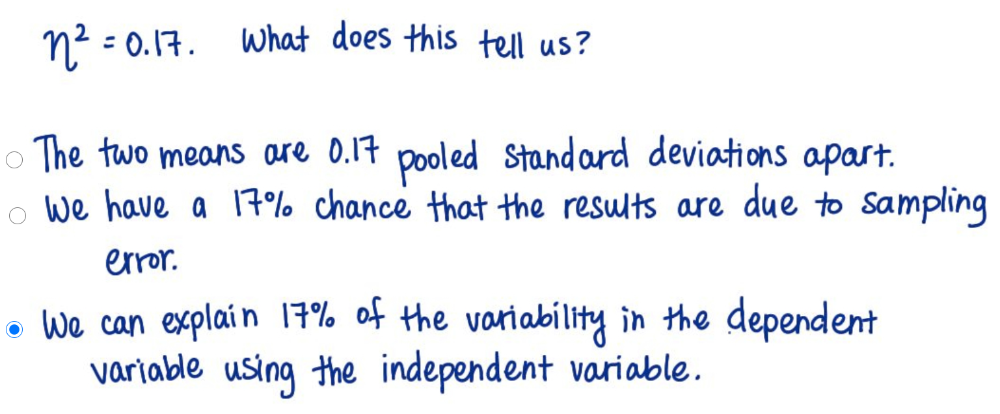

* independent variable = what we measure by test.

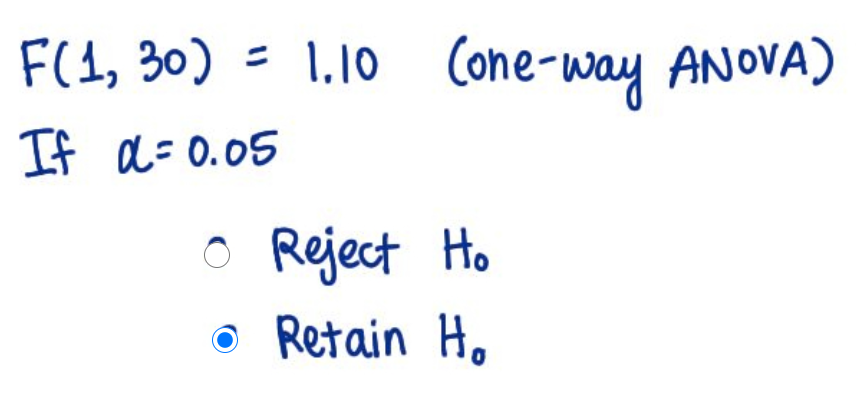


* F(1,30)= 1.10 
* F_critical is 4.17 according to F table.
* F_critical (4.17)> F_stats(1.10) = Failed to reject Ho.

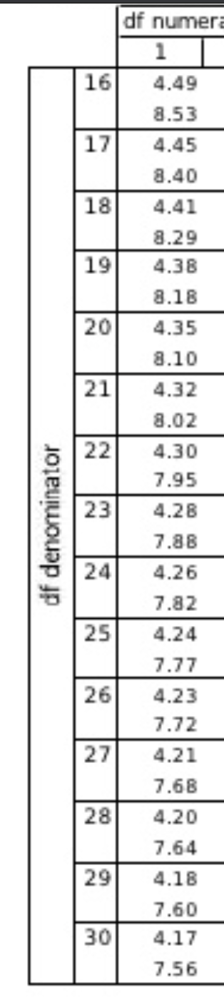

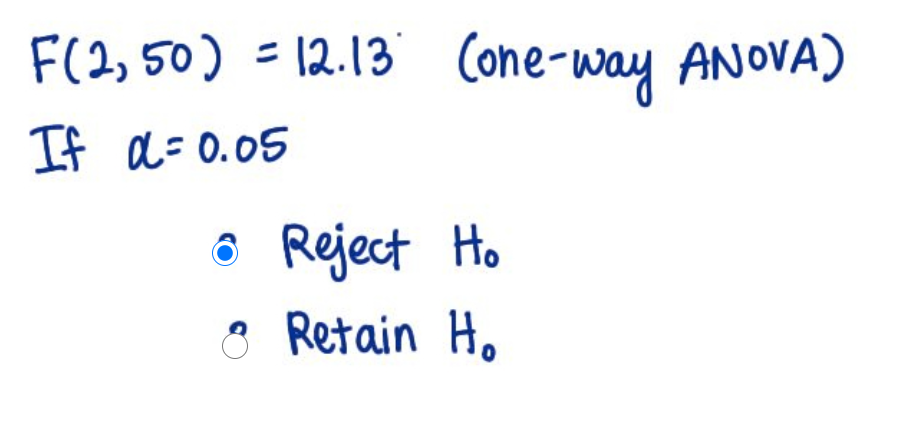

* f_critical 3.18 < f_stats 12.3 = Reject Ho


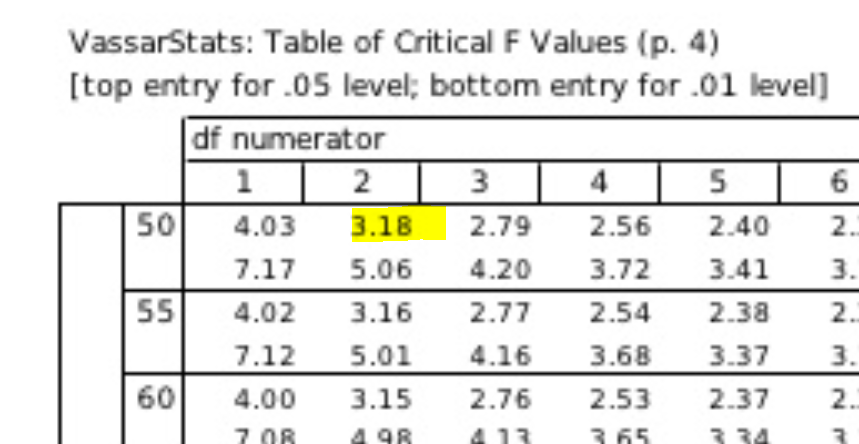

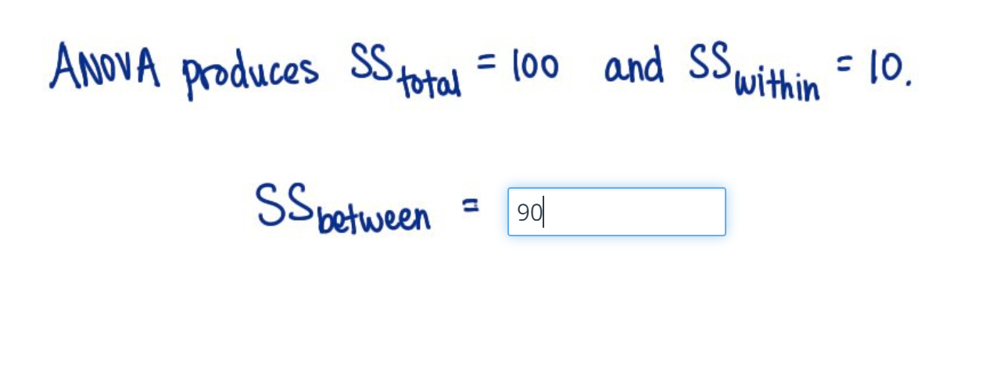

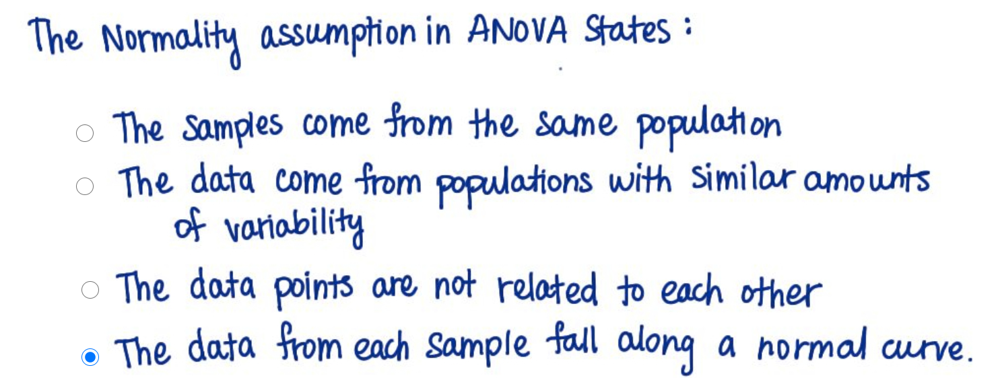

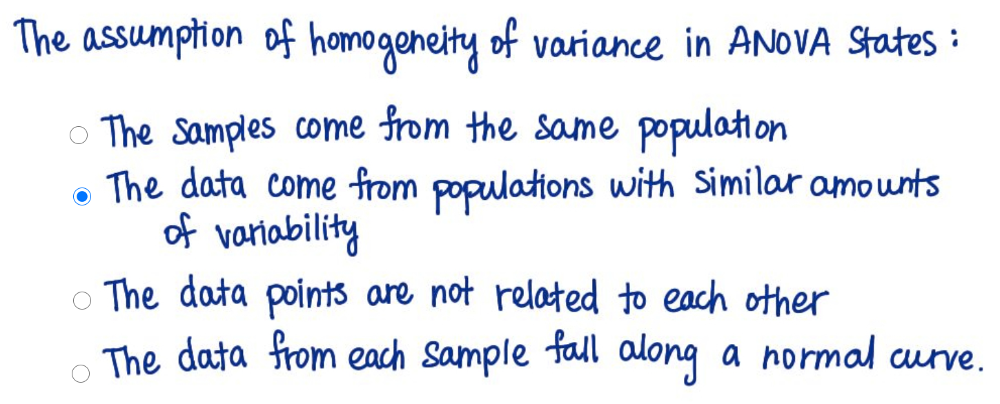

* homogeneity : the quality of consisting of parts or people that are similar to each other or are of the same type:

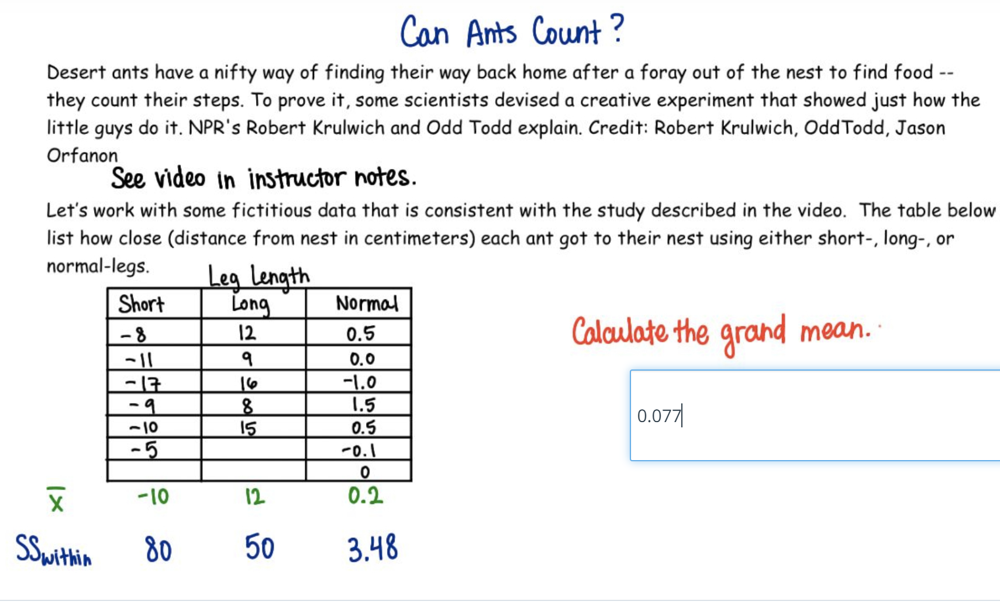

In [149]:
# made a dataframe

d = {'short': [-8,-11,-17,-9,-10,-5,np.nan], 'long': [12,9,16,8,15,np.nan,np.nan],'normal':[0.5,0.0,-1.0,1.5,0.5,-0.1,0.0]}
ants_legs = pd.DataFrame(data=d)
ants_legs

,short,long,normal
0,-8.0,12.0,0.5
1,-11.0,9.0,0.0
2,-17.0,16.0,-1.0
3,-9.0,8.0,1.5
4,-10.0,15.0,0.5
5,-5.0,NaN,-0.1
6,NaN,NaN,0.0


In [150]:
# print anova table for each treatments

rp.summary_cont(ants_legs['normal'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,normal,7.0,0.2,0.761577,0.287849,-0.504342,0.904342


In [151]:
# if nan contains, will not print. 
# remove "NaN" by dropna()

rp.summary_cont(ants_legs['short'].dropna())

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,short,6.0,-10.0,4.0,1.632993,-14.197743,-5.802257


In [152]:
rp.summary_cont(ants_legs['long'].dropna())

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,long,5.0,12.0,3.535534,1.581139,7.610055,16.389945


In [153]:
# prepare new dataframe for easier analysis 

n=list(ants_legs['normal'].values)
n

[0.5, 0.0, -1.0, 1.5, 0.5, -0.1, 0.0]

In [154]:
s=list(ants_legs['short'].dropna().values)
s

[-8.0, -11.0, -17.0, -9.0, -10.0, -5.0]

In [155]:
l=list(ants_legs['long'].dropna().values)
l

[12.0, 9.0, 16.0, 8.0, 15.0]

In [156]:
scores=n+s+l
scores

[0.5,
 0.0,
 -1.0,
 1.5,
 0.5,
 -0.1,
 0.0,
 -8.0,
 -11.0,
 -17.0,
 -9.0,
 -10.0,
 -5.0,
 12.0,
 9.0,
 16.0,
 8.0,
 15.0]

In [157]:
ants=(["normal"]*len(n))+(["short"]*len(s)+(["long"]*len(l)))

In [158]:
ants_legs2=pd.DataFrame({"Types_of_ants":ants,"Scores":scores})
ants_legs2

,Types_of_ants,Scores
0,normal,0.5
1,normal,0.0
2,normal,-1.0
3,normal,1.5
4,normal,0.5
5,normal,-0.1
6,normal,0.0
7,short,-8.0
8,short,-11.0
9,short,-17.0


In [159]:
ants_legs2.groupby("Types_of_ants").mean()

,Scores
Types_of_ants,
long,12.0
normal,0.2
short,-10.0


In [160]:
ants_legs2["gm"]=ants_legs2["Scores"].mean()
ants_legs2["gm"]

0     0.077778
1     0.077778
2     0.077778
3     0.077778
4     0.077778
5     0.077778
6     0.077778
7     0.077778
8     0.077778
9     0.077778
10    0.077778
11    0.077778
12    0.077778
13    0.077778
14    0.077778
15    0.077778
16    0.077778
17    0.077778
Name: gm, dtype: float64

In [166]:
# making group_means for easier analysis

1453.651111111111

In [162]:
group_means = ants_legs2.groupby("Types_of_ants").mean()
group_means = group_means.rename(columns={"Scores":"group_mean","gm":"grand_mean"})
group_means

,group_mean,grand_mean
Types_of_ants,,
long,12.0,0.077778
normal,0.2,0.077778
short,-10.0,0.077778


In [163]:
ants_legs2 =ants_legs2.merge(group_means,left_on="Types_of_ants",right_index=True)
ants_legs2

,Types_of_ants,Scores,gm,group_mean,grand_mean
0,normal,0.5,0.077778,0.2,0.077778
1,normal,0.0,0.077778,0.2,0.077778
2,normal,-1.0,0.077778,0.2,0.077778
3,normal,1.5,0.077778,0.2,0.077778
4,normal,0.5,0.077778,0.2,0.077778
5,normal,-0.1,0.077778,0.2,0.077778
6,normal,0.0,0.077778,0.2,0.077778
7,short,-8.0,0.077778,-10.0,0.077778
8,short,-11.0,0.077778,-10.0,0.077778
9,short,-17.0,0.077778,-10.0,0.077778


1453.651111111111

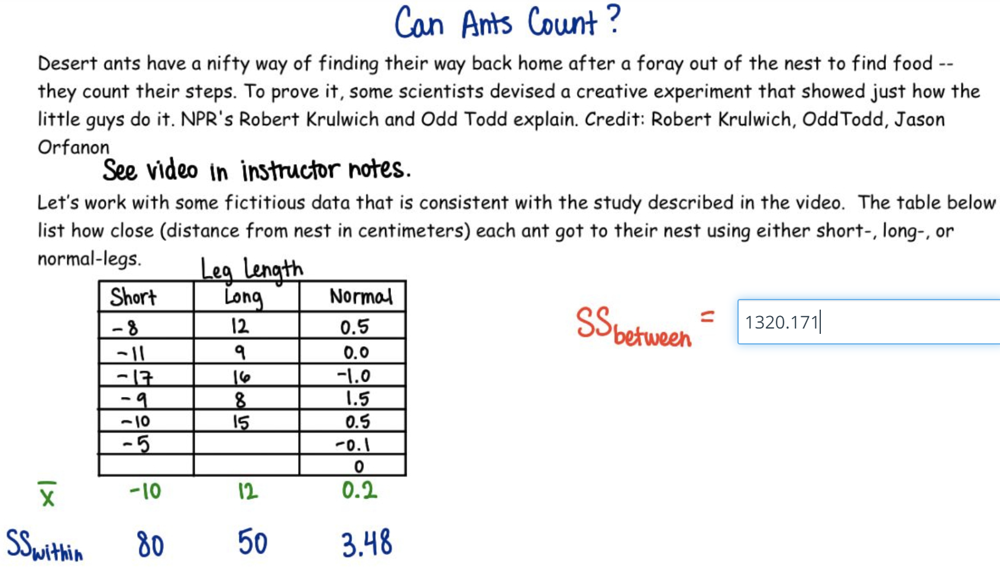

In [165]:
ssbetween = sum((ants_legs2["grand_mean"]-ants_legs2["group_mean"])**2)
ssbetween

1320.171111111111

* SSbetween = **ss explained**
* SSwithin = **ss redicual, ss wg(within group)**

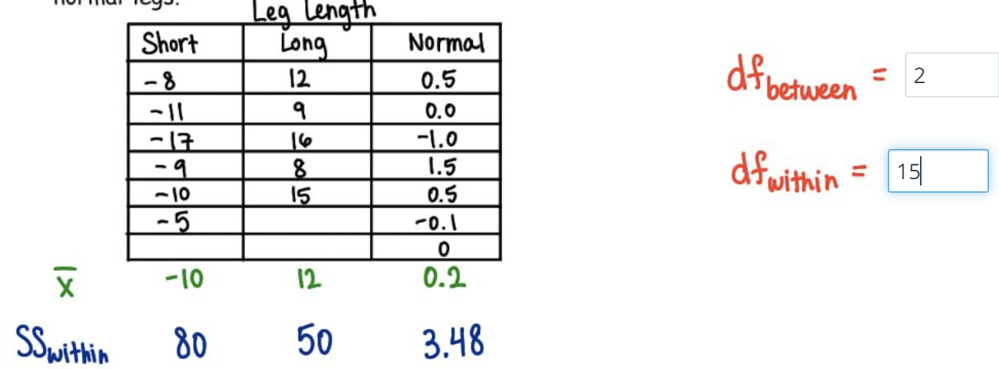

In [169]:
# k-1 :K is the number of population group
dfbetween= 3-1
dfbetween

2

In [168]:
# N-k  :N is total sample size
dfwithin = len(ants_legs2)-3
dfwithin

15

In [173]:
ants_legs2

,Types_of_ants,Scores,gm,group_mean,grand_mean
0,normal,0.5,0.077778,0.2,0.077778
1,normal,0.0,0.077778,0.2,0.077778
2,normal,-1.0,0.077778,0.2,0.077778
3,normal,1.5,0.077778,0.2,0.077778
4,normal,0.5,0.077778,0.2,0.077778
5,normal,-0.1,0.077778,0.2,0.077778
6,normal,0.0,0.077778,0.2,0.077778
7,short,-8.0,0.077778,-10.0,0.077778
8,short,-11.0,0.077778,-10.0,0.077778
9,short,-17.0,0.077778,-10.0,0.077778


In [211]:
sswithin=sum((ants_legs2["Scores"]-ants_legs2["group_mean"])**2)
sswithin

133.48000000000002

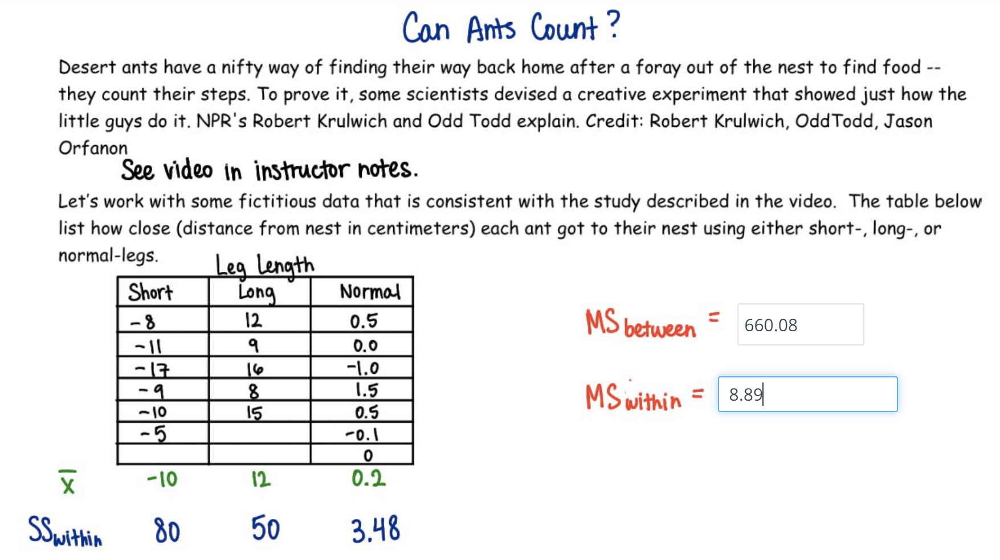

In [170]:
msbetween = ssbetween/dfbetween
msbetween

660.0855555555555

In [212]:
mswithin=sswithin/dfwithin
mswithin

8.898666666666667

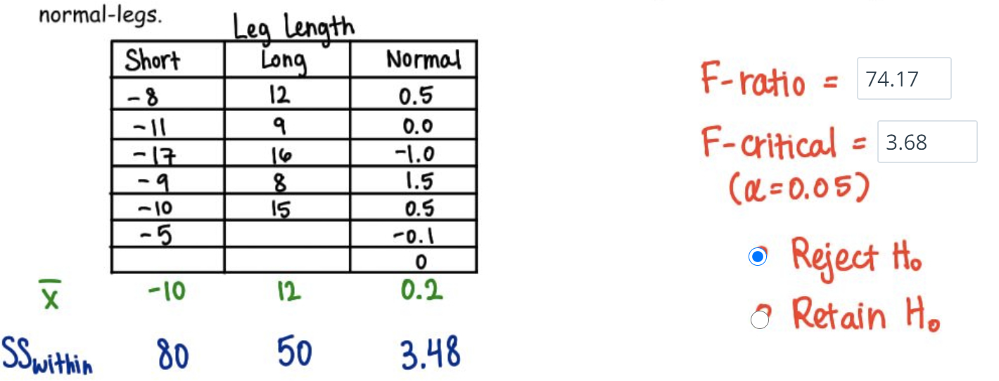

In [213]:
f_stats =msbetween/mswithin
f_stats

74.17802916791528

In [214]:
f_critical =3.68
f_critical 

3.68

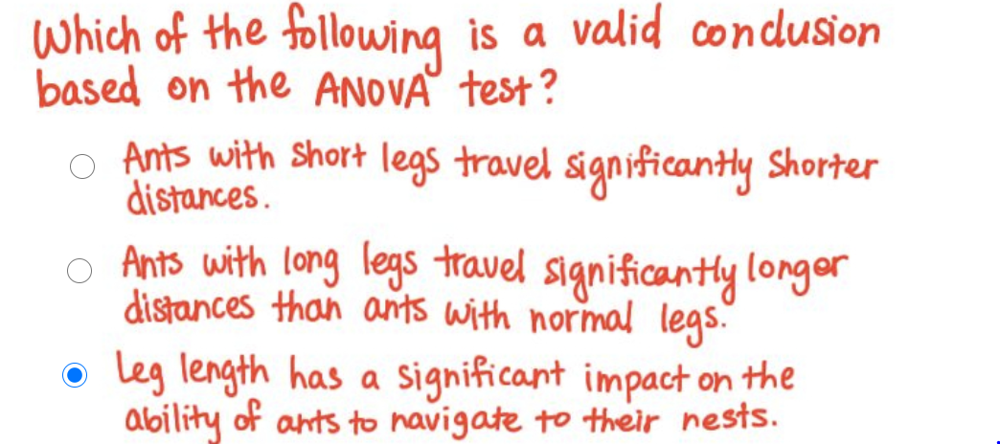

In [215]:
ants_legs2

,Types_of_ants,Scores,gm,group_mean,grand_mean
0,normal,0.5,0.077778,0.2,0.077778
1,normal,0.0,0.077778,0.2,0.077778
2,normal,-1.0,0.077778,0.2,0.077778
3,normal,1.5,0.077778,0.2,0.077778
4,normal,0.5,0.077778,0.2,0.077778
5,normal,-0.1,0.077778,0.2,0.077778
6,normal,0.0,0.077778,0.2,0.077778
7,short,-8.0,0.077778,-10.0,0.077778
8,short,-11.0,0.077778,-10.0,0.077778
9,short,-17.0,0.077778,-10.0,0.077778


In [221]:
math.sqrt(mswithin)

2.9830633024906907

In [222]:
# cohen's d
# normal (group mean) vs short (group mean)

(0.2-(-10))/math.sqrt(mswithin)

3.419303905312224

In [223]:
# cohen's d
# normal vs long 

(0.2 - 12)/math.sqrt(mswithin)

-3.955665302223946

In [226]:
# cohen's d
# short vs long 

(12--10)/math.sqrt(mswithin)

7.37496920753617

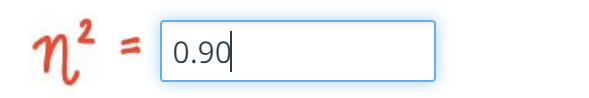

In [227]:
eta=ssbetween/ssttl
eta

0.908176041018554

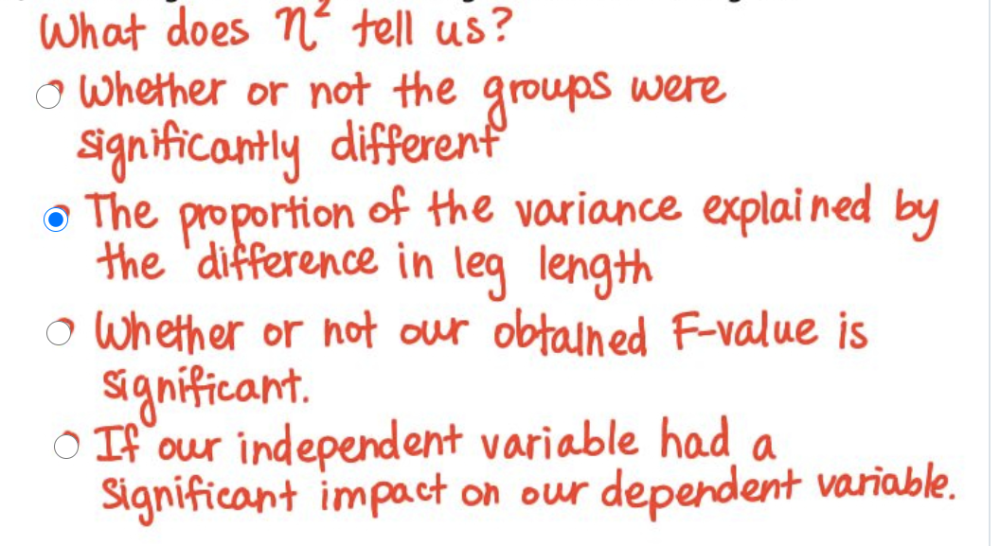

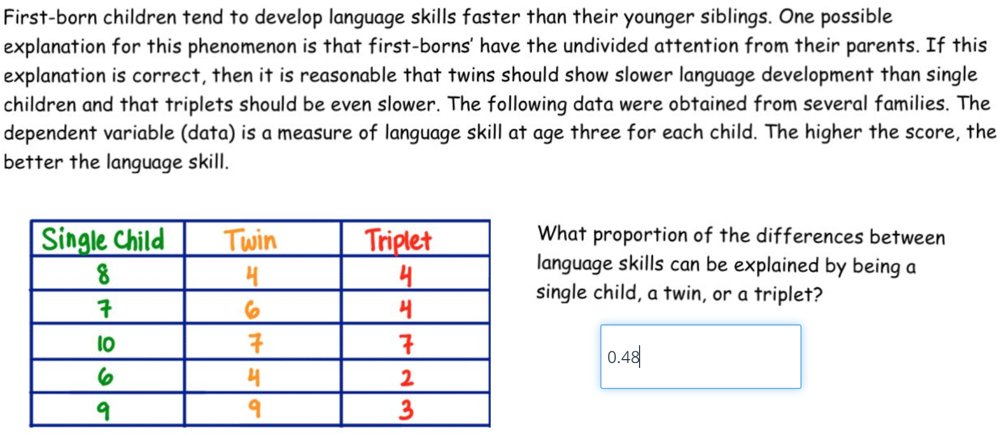

1. dataframe
2. group mean
3. grand mean
4. ssbetween, sswthin, ssttl
5. dfbetween and dfwithin
6. msbetween and mswithin
7. t_stats
8. eta

In [2]:
# made a dataframe

d = {'single': [8,7,10,6,9], 'twin': [4,6,7,4,9],'triple':[4,4,7,2,3]}
child = pd.DataFrame(data=d)
child

,single,twin,triple
0,8,4,4
1,7,6,4
2,10,7,7
3,6,4,2
4,9,9,3


In [3]:
# prepare new dataframe for easier analysis 

s=list(child['single'].values)
tw=list(child['twin'].values)
tp=list(child['triple'].values)
scores=s+tw+tp
chd=(["single"]*len(s))+(["twin"]*len(tw)+(["triple"]*len(tp)))
child2=pd.DataFrame({"CHILD":chd,"SCORES":scores})
child2

,CHILD,SCORES
0,single,8
1,single,7
2,single,10
3,single,6
4,single,9
5,twin,4
6,twin,6
7,twin,7
8,twin,4
9,twin,9


In [4]:
group_means = child2.groupby("CHILD").mean()
group_means["grand_mean"] =child2["SCORES"].mean()
group_means = group_means.rename(columns={"SCORES":"group_mean"})
group_means

,group_mean,grand_mean
CHILD,,
single,8,6.0
triple,4,6.0
twin,6,6.0


In [5]:
child2 = child2.merge(group_means,left_on="CHILD",right_index=True)
child2

,CHILD,SCORES,group_mean,grand_mean
0,single,8,8,6.0
1,single,7,8,6.0
2,single,10,8,6.0
3,single,6,8,6.0
4,single,9,8,6.0
5,twin,4,6,6.0
6,twin,6,6,6.0
7,twin,7,6,6.0
8,twin,4,6,6.0
9,twin,9,6,6.0


In [15]:
ssbetween = sum((child2["group_mean"]-child2["grand_mean"])**2)
ssbetween

40.0

In [26]:
sswithin=sum((child2["SCORES"]-child2["group_mean"])**2)
sswithin

42

In [27]:
ssttl =sswithin + ssbetween
ssttl

82.0

In [28]:
dfbetween=3-1
dfbetween

2

In [29]:
dfwithin = len(child2)-3
dfwithin

12

In [30]:
msbetween=ssbetween/dfbetween
msbetween

20.0

In [31]:
mswithin = sswithin/dfwithin
mswithin

3.5

In [32]:
f_stats = msbetween/mswithin
f_stats

5.714285714285714

In [44]:
eta = ssbetween/ssttl
eta

0.4878048780487805

* df is the degrees of freedom for within-group variability. = dfwithin
* k is the number of groups/samples in your study = 3 groups
* q =3.77

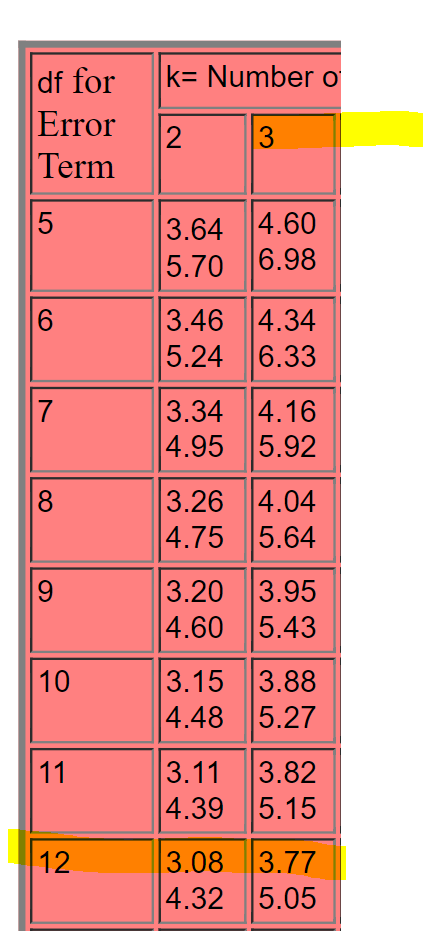

In [49]:
q=3.77
n=3

In [51]:
hsd = q*math.sqrt(mswithin/n)
hsd = np.round(hsd,decimals=3)
hsd 

4.072

In [52]:

from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [55]:
m_comp = pairwise_tukeyhsd(endog=child2["SCORES"], groups=child2["CHILD"], alpha=0.05)
print(m_comp)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
single triple     -4.0 0.0139 -7.1551 -0.8449   True
single   twin     -2.0 0.2484 -5.1551  1.1551  False
triple   twin      2.0 0.2484 -1.1551  5.1551  False
----------------------------------------------------


In [56]:
m_comp.q_crit

3.771072585803293

In [57]:
m_comp.pvalues

array([0.01394805, 0.24844532, 0.24844532])

In [58]:
m_comp.variance

3.5

In [59]:
m_comp._multicomp.data

array([ 8,  7, 10,  6,  9,  4,  6,  7,  4,  9,  4,  4,  7,  2,  3],
      dtype=int64)

In [61]:
m_comp._results_table

group1,group2,meandiff,p-adj,lower,upper,reject
single,triple,-4.0,0.0139,-7.1551,-0.8449,True
single,twin,-2.0,0.2484,-5.1551,1.1551,False
triple,twin,2.0,0.2484,-1.1551,5.1551,False


In [62]:
m_comp.meandiffs

array([-4., -2.,  2.])

In [63]:
m_comp.reject

array([ True, False, False])

In [69]:
m_comp.std_pairs

array([0.83666003, 0.83666003, 0.83666003])

In [70]:
m_comp.confint

array([[-7.15510569, -0.84489431],
       [-5.15510569,  1.15510569],
       [-1.15510569,  5.15510569]])

In [71]:
m_comp.df_total

12

In [72]:
m_comp.reject2

array([ True, False, False])

In [280]:
xbarsgl=8
xbartwn=6
xbartpl=4

In [281]:
xbarsgl-xbartwn

2

In [282]:
xbarsgl-xbartpl

4

In [283]:
xbartpl-xbartwn

-2

* Greater than hsd(4.07) = All of te difference are honestly significantly different.